In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from collections import defaultdict
import copy

import sys
import os

notebook_dir = os.getcwd()
root_dir = os.path.abspath(os.path.join(notebook_dir, '..'))

if root_dir not in sys.path:
    sys.path.append(root_dir)


from ml_from_scratch.decision_tree.plotting import _plot_recursive, plot_tree
from ml_from_scratch.decision_tree.utils import k_fold_split
from ml_from_scratch.decision_tree.tree import DecisionTree
from ml_from_scratch.decision_tree.config import DecisionTreeConfig
from ml_from_scratch.decision_tree.cross_validation import train_tree, evaluate_tree, _aggregate_results

# from experiments.evaluate_dateset import load_dataset

In [27]:
from typing import Tuple

# Load Data
def load_wifi_txt(path: str) -> Tuple[np.ndarray, np.ndarray]:
    arr = np.loadtxt(path)
    X = arr[:, :-1].astype(np.float64)
    y_raw = arr[:, -1].astype(np.int64)
    y = y_raw - 1 #Since we want to start with 0
    return X, y

def load_dataset(dataset: str) -> Tuple[np.ndarray, np.ndarray]:
    '''Return (X, y) for 'clean' or 'noisy' dataset.'''
    if dataset == "clean":
        return load_wifi_txt("../data/wifi_db/clean_dataset.txt")
    elif dataset == "noisy":
        return load_wifi_txt("../data/wifi_db/noisy_dataset.txt")
    else:
        raise ValueError("dataset must be 'clean' or 'noisy'")

In [28]:
X_clean, y_clean = load_dataset("clean")
X_noisy, y_noisy = load_dataset("noisy")

In [29]:
# Split with K=10, i.e 1/10 is test and valid and 8/10 is train
k = 10
max_depth = 50

split_indcies = k_fold_split(k, len(X_clean))
test_idx, val_idx = split_indcies[0], split_indcies[1]
train_idx = np.setdiff1d(np.arange(len(X_clean)), np.concatenate([test_idx, val_idx]))

X_clean_train, y_clean_train = X_clean[train_idx], y_clean[train_idx]
X_clean_val, y_clean_val = X_clean[val_idx], y_clean[val_idx]
X_clean_test, y_clean_test = X_clean[test_idx], y_clean[test_idx]

X_noisy_train, y_noisy_train = X_noisy[train_idx], y_noisy[train_idx]
X_noisy_val, y_noisy_val = X_noisy[val_idx], y_noisy[val_idx]
X_noisy_test, y_noisy_test = X_noisy[test_idx], y_noisy[test_idx]

In [30]:
# Fit trees
config = DecisionTreeConfig(max_depth=max_depth)

tree_clean = train_tree(X_clean_train, y_clean_train, X_clean_val, y_clean_val, config=config, prune=False)
tree_noisy = train_tree(X_noisy_train, y_noisy_train, X_noisy_val, y_noisy_val, config=config, prune=False)
tree_noisy_pre_prune = copy.deepcopy(tree_noisy)
tree_noisy.prune(X_noisy_train, y_noisy_train, X_noisy_val, y_noisy_val)


In [31]:
# trees = [
#     ("clean", tree_clean),
#     ("noisy", tree_noisy),
#     ("pruned", tree_noisy_pre_prune),
# ]
#
# for name, tree in trees:
#     print(f"Accuracy on {name} dataset: {_aggregate_results(evaluate_tree(tree, X_clean_test, y_clean_test))}")

In [32]:
def plot_tree_pair(before_root, after_root, max_depth, figsize=(30, 9)):
    import matplotlib.pyplot as plt

    fig, axes = plt.subplots(1, 2, figsize=(2 * figsize[0], figsize[1]))

    for ax, root, title in zip(
        axes, [before_root, after_root], ["Before Pruning", "After Pruning"]
    ):
        _plot_recursive(ax, root, max_depth, x=0, y=0, h_spread=2**max_depth, v_dist=2.0)
        ax.axis("off")
        ax.set_title(title)

    plt.tight_layout()

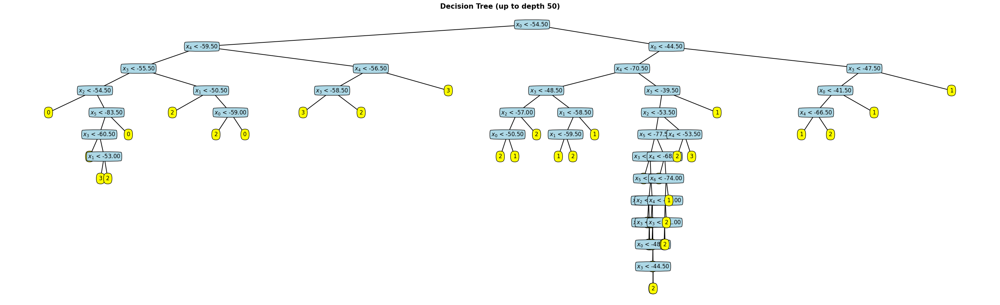

In [33]:
# Plot clean tree
plot_tree(tree_clean.root, max_depth)

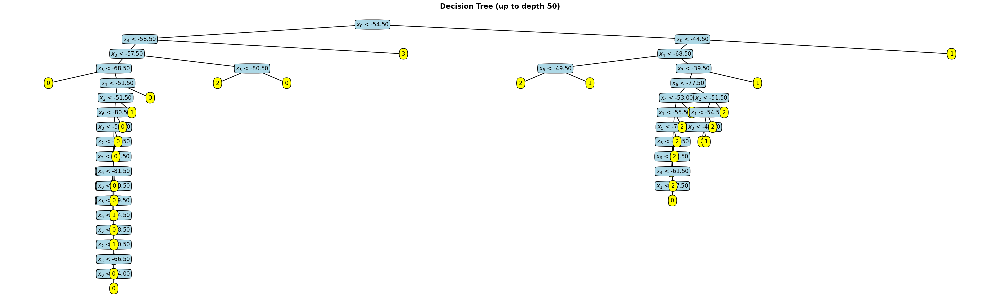

In [34]:
# Plot noisy tree
plot_tree(tree_noisy.root, max_depth)

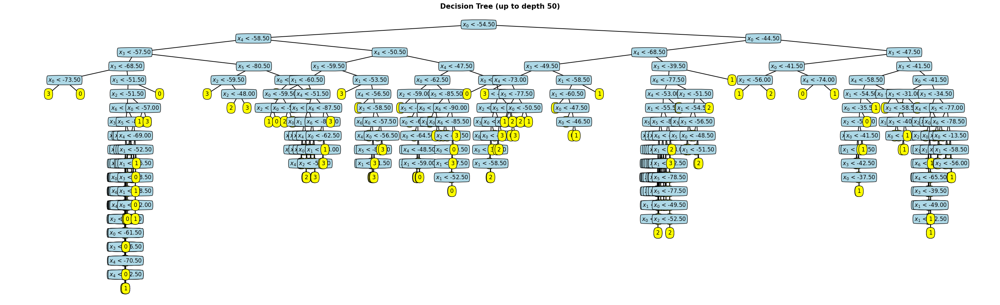

In [35]:
plot_tree(tree_noisy_pre_prune.root, max_depth)

In [36]:
def collect_splits(node, depth=0, splits=None):
    if splits is None:
        splits = []
    # base case :Lead
    if node is None or node.label is not None:
        return splits
    splits.append((node.feature, node.threshold, depth))
    collect_splits(node.left, depth+1, splits)
    collect_splits(node.right, depth+1, splits)
    return splits

In [37]:

def pairgrid_tree_regions(
        X, y, tree,
        class_names=None,
        grid_points=100,
        cmap=None,
        figsize_scale=2.5,
        scatter_alpha=0.5,
        show_points=True,
        draw_thresholds=False,
        fig=None, axes=None,
        X_ref = None,
):
    n_samples, d = X.shape

    classes = np.unique(y)
    k = len(classes)
    if class_names is None:
        class_names = [str(c+1) for c in classes] # 1, 2, ... k

    # if cmap is None:
    tab10 = plt.get_cmap("tab10")  # 10 distinct strong colors
    colors = [tab10(i) for i in range(k)]
    cmap = ListedColormap(colors)


    if X_ref is None:
        X_ref = X
    mins, maxs, median = X_ref.min(axis=0), X_ref.max(axis=0), np.median(X_ref, axis=0)
    pads = 0.05 * (maxs - mins + 1e-10)
    mins -= pads; maxs += pads

    thresholds_per_feature = defaultdict(list)

    if fig is None or axes is None:
        fig, axes = plt.subplots(d, d, figsize=(figsize_scale * d, figsize_scale * d))
    # add d =1 case

    # FOr Thresholds
    if draw_thresholds:
        splits = collect_splits(tree.root)
        max_depth = max(d for _, _, d in splits) if splits else 1


    for i in range(d): # row
        for j in range(d): # col

            ax = axes[i, j]

            if i == j:
                # diangonal as a 1d histogram
                ax.hist(X[:, i], bins=30, density=True, color='royalblue', edgecolor='black', alpha=0.7)
                ax.set_xlim(mins[j], maxs[j])

                if i == 0:
                     ax.set_ylabel(f'$x_{j}$')
                     ax.set_yticks([])
                     ax.yaxis.set_label_coords(-0.21, 0.5)
                     continue
                if i == d-1:
                    ax.set_xlabel(f'$x_{j}$')
                    ax.set_yticks([])
                    continue

                ax.set_yticks([])
                continue

            x1 = np.linspace(mins[j], maxs[j], grid_points)
            x2 = np.linspace(mins[i], maxs[i], grid_points)
            XX, YY = np.meshgrid(x1, x2)

            grid = np.tile(median, (grid_points * grid_points, 1))
            grid[:, j] = XX.ravel()
            grid[:, i] = YY.ravel()

            predictions = tree.predict(grid).reshape(grid_points, grid_points)

            ax.imshow(
                predictions,
                alpha=0.3,
                origin='lower',  # flip so y increases upward
                extent=(mins[j], maxs[j], mins[i], maxs[i]),
                aspect='auto', # make all plots sqaure
                cmap=cmap
            )

            if show_points:
                for c_idx, c in enumerate(classes):
                    mask = (y == c)
                    ax.scatter(
                        X[mask, j], X[mask, i],
                        alpha=scatter_alpha,
                        edgecolors='white',
                        linewidths=0.8,
                        s=20,
                        color=colors[c_idx],
                        label=class_names[c_idx]
                    )

            if draw_thresholds:
                for feature, thr, depth in splits:
                    alpha = 0.5* (1 - depth/ (max_depth + 1))
                    lw = 1 - depth/ (max_depth + 1)

                    #if the split feature is in current plot
                    if feature == j:
                        ax.axvline(x=thr, color='black', alpha=alpha, lw=lw)
                    elif feature == i:
                        ax.axhline(y=thr, color='black', alpha=alpha, lw=lw)


            if i < d - 1:
                ax.set_xticklabels([])
            else:
                ax.set_xlabel(f'$x_{j}$')

            if  j > 0:
                ax.set_yticklabels([])
            else:
                ax.set_ylabel(f'$x_{i}$')

            ax.set_xlim(mins[j], maxs[j])
            ax.set_ylim(mins[i], maxs[i])




    # fake point for legend
    handles = [
        plt.Line2D([0], [0],
            marker='o',      # draw a circular marker
            lw=0,            # no line connecting points
            ms=6,            # marker size
            mec='white',     # marker edge color
            mew=0.6,         # marker edge width
            mfc=colors[c] # marker fill color (same as scatter color)
        )
        for c in classes
    ]

    fig.legend(
        handles,
        class_names,          # labels to show beside each dot
        loc="upper center",   # where to place the legend
        ncol=min(k, 6),       # spread across up to 6 columns
        frameon=False         # remove box outline
    )

    plt.tight_layout(rect=(0, 0, 1, 0.96))
    return fig, axes

In [38]:
def compare_pairgrids(
        X1, y1, tree1,
        X2, y2, tree2,
        title1=': Tree 1', title2=': Tree 2',
        figsize_scale=2.5,
        **kwargs
):

    d = X = X1.shape[1]
    fig = plt.figure(figsize=(figsize_scale*d*2, figsize_scale*d))
    subfigs = fig.subfigures(1, 2, wspace=0.05)

    for subfig, X, y, tree, title in zip(subfigs, (X1, X2), (y1, y2), (tree1, tree2), (title1, title2)):
        axes = subfig.subplots(d, d)
        # plt.sca(axes)
        pairgrid_tree_regions(X, y, tree,
                              fig=subfig, axes=axes,
                              **kwargs)
        subfig.suptitle(title)
        subfig.subplots_adjust(wspace=0.02, hspace=0.02)

    plt.tight_layout()
    return fig, axes

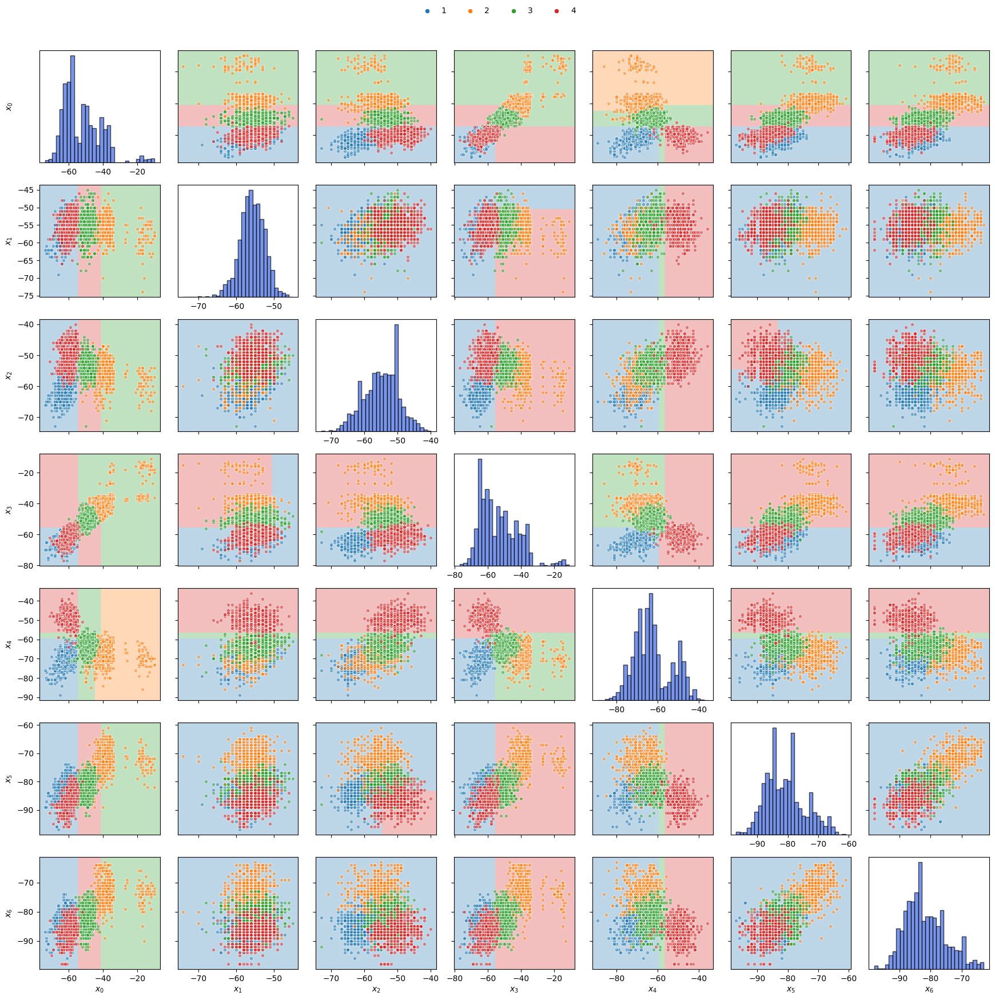

In [39]:
pairgrid_tree_regions(X_clean, y_clean, tree_clean,
                      show_points=True,
                      draw_thresholds=False);

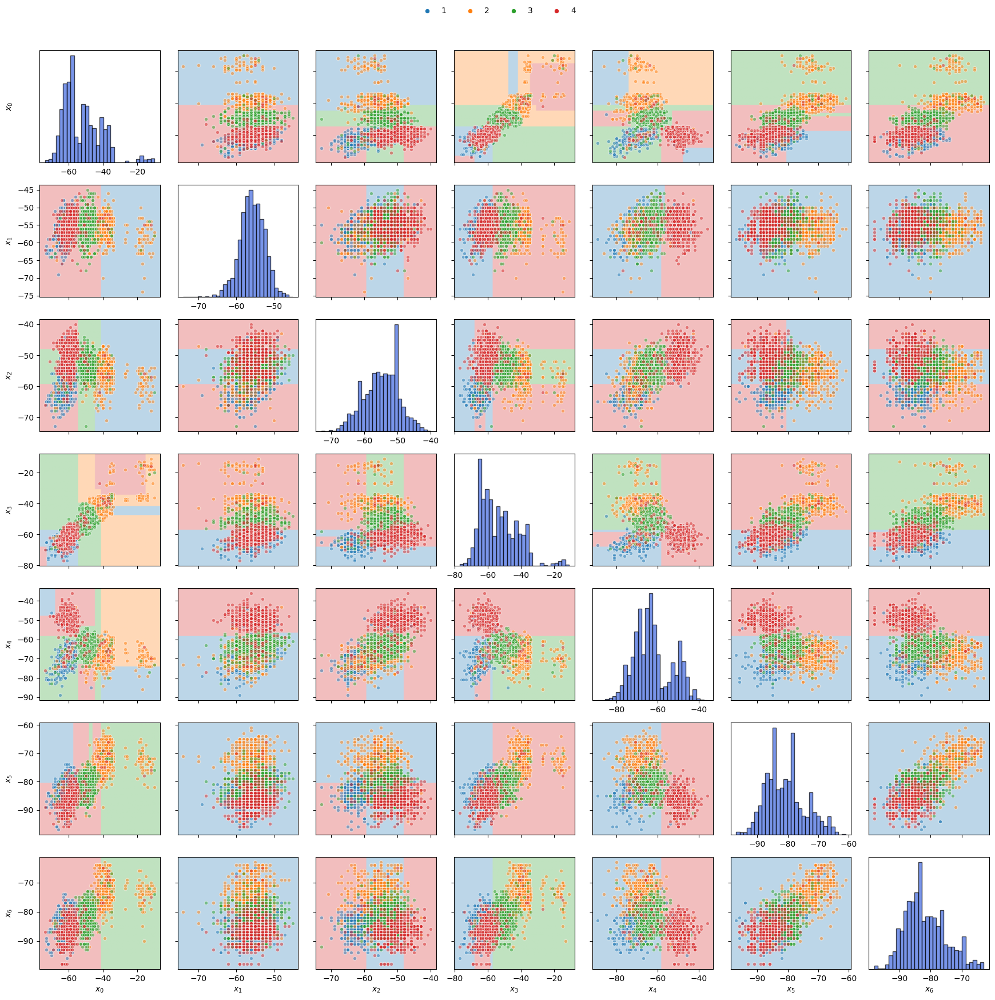

In [40]:
pairgrid_tree_regions(X_noisy, y_noisy, tree_noisy_pre_prune,
                      show_points=True,
                      draw_thresholds=False);

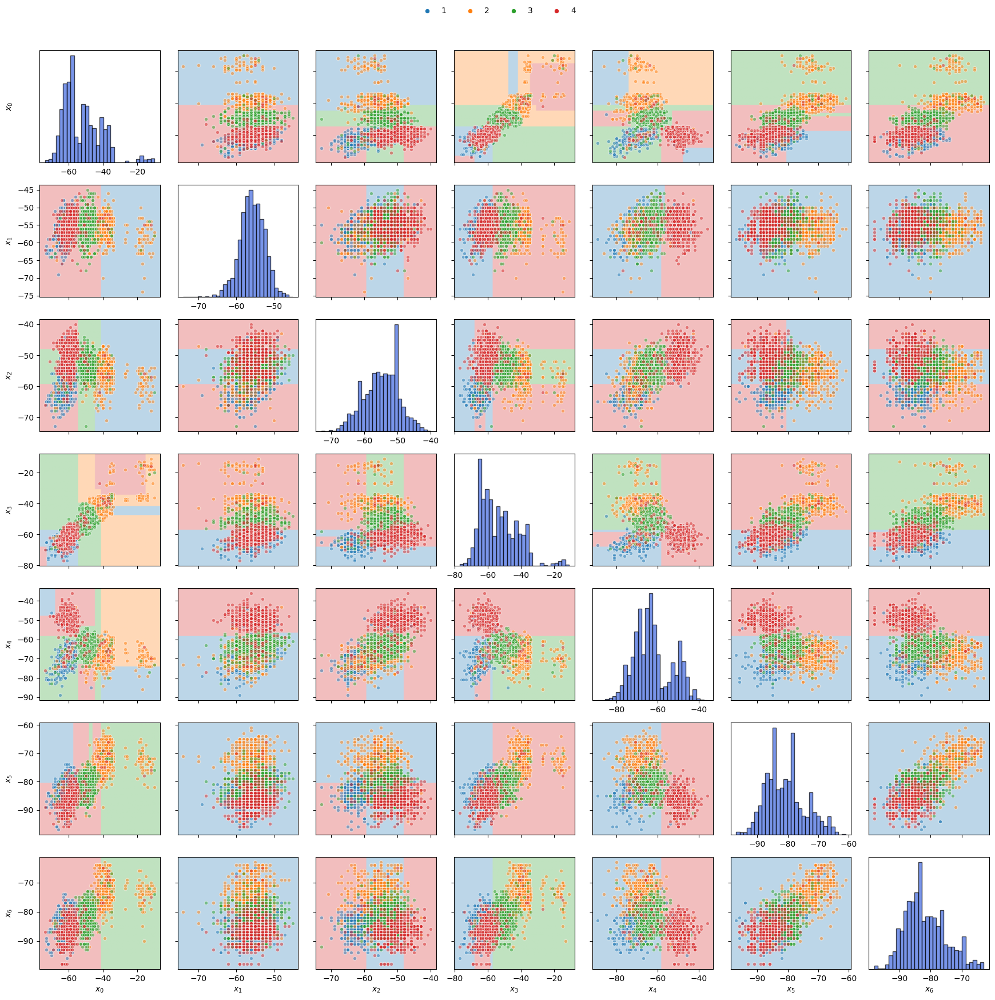

In [41]:
pairgrid_tree_regions(X_noisy, y_noisy, tree_noisy_pre_prune,
                      show_points=True,
                      draw_thresholds=False);

In [42]:

def compair_pairgrid_tree_regions_same_grid(
        X1, y1, tree1,
        X2, y2, tree2,
        class_names=None,
        grid_points=100,
        cmap=None,
        figsize_scale=2.5,
        scatter_alpha=0.5,
        show_points=True,
        draw_thresholds=False,
        fig=None, axes=None,
        X_ref = None,
):
    n_samples1, d1 = X1.shape
    n_samples2, d2 = X2.shape

    assert d1 == d2, "Both datasets must have the same number of dimensions"
    d = d1

    classes = np.unique(y1)
    k = len(classes)
    if class_names is None:
        class_names = [str(c+1) for c in classes] # 1, 2, ... k

    # if cmap is None:
    tab10 = plt.get_cmap("tab10")  # 10 distinct strong colors
    colors = [tab10(i) for i in range(k)]
    cmap = ListedColormap(colors)


    if X_ref is None:
        X_ref = X1

    # Compute shared range using both datasets
    mins = np.minimum(X1.min(axis=0), X2.min(axis=0))
    maxs = np.maximum(X1.max(axis=0), X2.max(axis=0))
    pads = 0.05 * (maxs - mins + 1e-10)
    mins -= pads; maxs += pads
    median = np.median(np.vstack([X1, X2]), axis=0)

    thresholds_per_feature = defaultdict(list)

    if fig is None or axes is None:
        fig, axes = plt.subplots(d, d, figsize=(figsize_scale * d, figsize_scale * d))
    # add d =1 case

    # FOr Thresholds
    splits1 = collect_splits(tree1.root) if draw_thresholds else []
    splits2 = collect_splits(tree2.root) if draw_thresholds else []

    for i in range(d): # row
        for j in range(d): # col

            ax = axes[i, j]

            if i == j:
                # diangonal as a 1d histogram
                # ax.hist(X1[:, i], bins=30, density=True, color='royalblue', edgecolor='black', alpha=0.8)
                # ax.hist(X2[:, i], bins=30, density=True, color='lightgreen', edgecolor='black', alpha=0.4)

                # Plot class-wise histograms for clean (X1)
                for c_idx, c in enumerate(classes):
                    mask = (y1 == c)
                    if np.any(mask):
                        ax.hist(
                            X1[mask, i],
                            bins=30,
                            density=True,
                            color=colors[c_idx],
                            alpha=0.7,
                            edgecolor='black',
                            linewidth=0.5,
                            label=f"Clean class {c}"
                        )

                # Plot class-wise histograms for noisy (X2)
                for c_idx, c in enumerate(classes):
                    mask = (y2 == c)
                    if np.any(mask):
                        ax.hist(
                            X2[mask, i],
                            bins=30,
                            density=True,
                            color=colors[c_idx],
                            alpha=0.6,
                            edgecolor='white',
                            linewidth=0.5,
                            linestyle='dashed',
                            label=f"Noisy class {c}"
                        )



                ax.set_xlim(mins[j], maxs[j])

                if i == 0:
                     ax.set_ylabel(f'$x_{j}$')
                     ax.set_yticks([])
                     ax.yaxis.set_label_coords(-0.20, 0.5)
                     continue
                if i == d1-1:
                    ax.set_xlabel(f'$x_{j}$')
                    ax.set_yticks([])
                    continue

                ax.set_yticks([])
                continue


            # --- Upper triangle: tree1 (e.g., clean) ---
            if i < j:
                _draw_region(ax, X1, y1, tree1, i, j, mins, maxs, median,
                             grid_points, cmap, colors, scatter_alpha, show_points, splits1, draw_thresholds)

            # --- Lower triangle: tree2 (e.g., noisy) ---
            else:
                _draw_region(ax, X2, y2, tree2, i, j, mins, maxs, median,
                             grid_points, cmap, colors, scatter_alpha, show_points, splits2, draw_thresholds)

            if i < d - 1:
                ax.set_xticklabels([])
            else:
                ax.set_xlabel(f'$x_{j}$')
            if  j > 0:
                ax.set_yticklabels([])
            else:
                ax.set_ylabel(f'$x_{i}$')
            ax.set_xlim(mins[j], maxs[j])
            ax.set_ylim(mins[i], maxs[i])


    # fake point for legend
    handles = [
        plt.Line2D([0], [0],
            marker='o',      # draw a circular marker
            lw=0,            # no line connecting points
            ms=6,            # marker size
            mec='white',     # marker edge color
            mew=0.6,         # marker edge width
            mfc=colors[c] # marker fill color (same as scatter color)
        )
        for c in classes
    ]

    fig.legend(
        handles,
        class_names,          # labels to show beside each dot
        loc="upper center",   # where to place the legend
        ncol=min(k, 6),       # spread across up to 6 columns
        frameon=False         # remove box outline
    )

    plt.tight_layout(rect=(0, 0, 1, 0.96))
    return fig, axes

def _draw_region(ax, X, y, tree, i, j, mins, maxs, median, grid_points, cmap, colors, scatter_alpha, show_points, splits, draw_thresholds, upper_triangle=True):
    x1 = np.linspace(mins[j], maxs[j], grid_points)
    x2 = np.linspace(mins[i], maxs[i], grid_points)
    XX, YY = np.meshgrid(x1, x2)

    grid = np.tile(median, (grid_points * grid_points, 1))
    if upper_triangle:
        grid[:, j] = XX.ravel()
        grid[:, i] = YY.ravel()
    else:
        grid[:, i] = XX.ravel()
        grid[:, j] = YY.ravel()

    predictions = tree.predict(grid).reshape(grid_points, grid_points)

    ax.imshow(
        predictions,
        alpha=0.3,
        origin='lower',  # flip so y increases upward
        extent=(mins[j], maxs[j], mins[i], maxs[i]),
        aspect='auto', # make all plots sqaure
        cmap=cmap
    )

    if show_points:

        classes = np.unique(y)
        class_names = [str(c+1) for c in classes]

        for c_idx, c in enumerate(classes):
            mask = (y == c)
            ax.scatter(
                X[mask, j], X[mask, i],
                alpha=scatter_alpha,
                edgecolors='white',
                linewidths=0.8,
                s=20,
                color=colors[c_idx],
                label=class_names[c_idx]
            )

    if draw_thresholds and splits:
        for feature, thr, depth in splits:
            alpha = 0.5* (1 - depth/ (max_depth + 1))
            lw = 1 - depth/ (max_depth + 1)

            #if the split feature is in current plot
            if feature == j:
                ax.axvline(x=thr, color='black', alpha=alpha, lw=lw)
            elif feature == i:
                ax.axhline(y=thr, color='black', alpha=alpha, lw=lw)

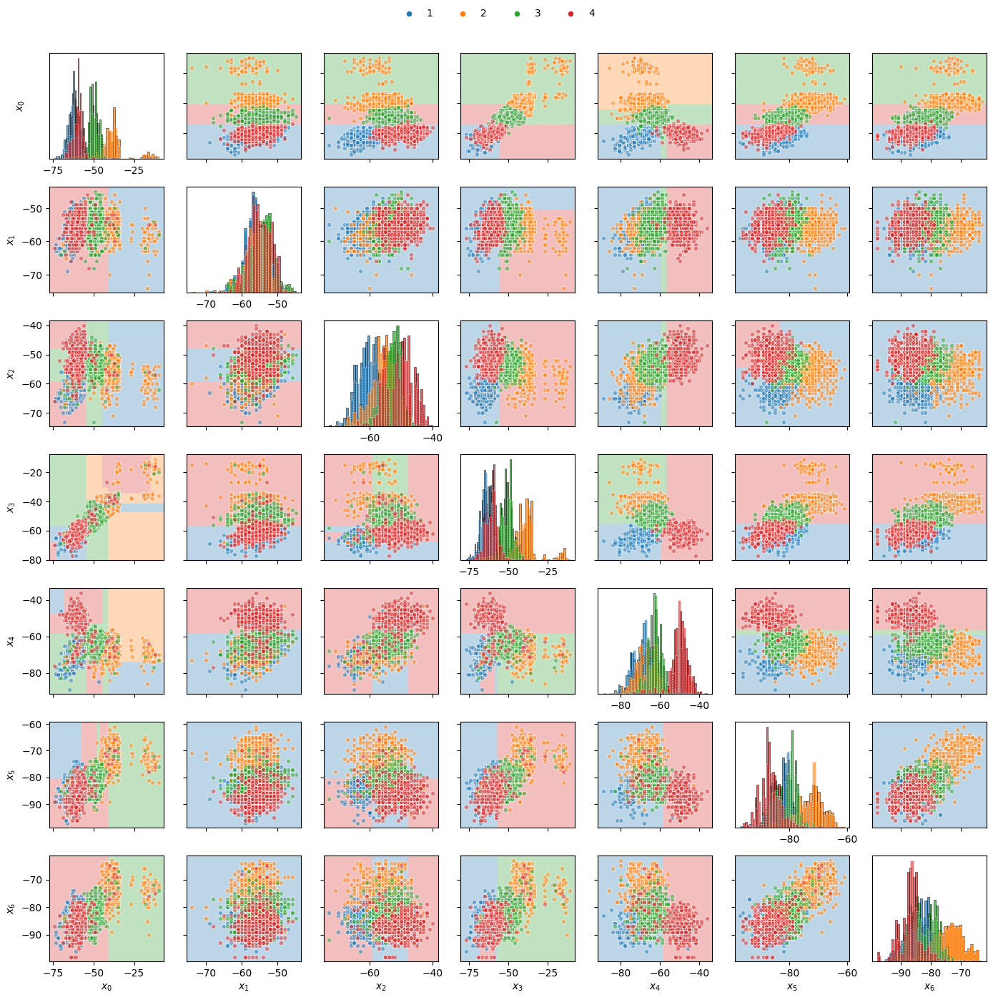

In [43]:
compair_pairgrid_tree_regions_same_grid(X_clean, y_clean, tree_clean,
                                        X_noisy, y_noisy, tree_noisy_pre_prune,
                                        figsize_scale=2);

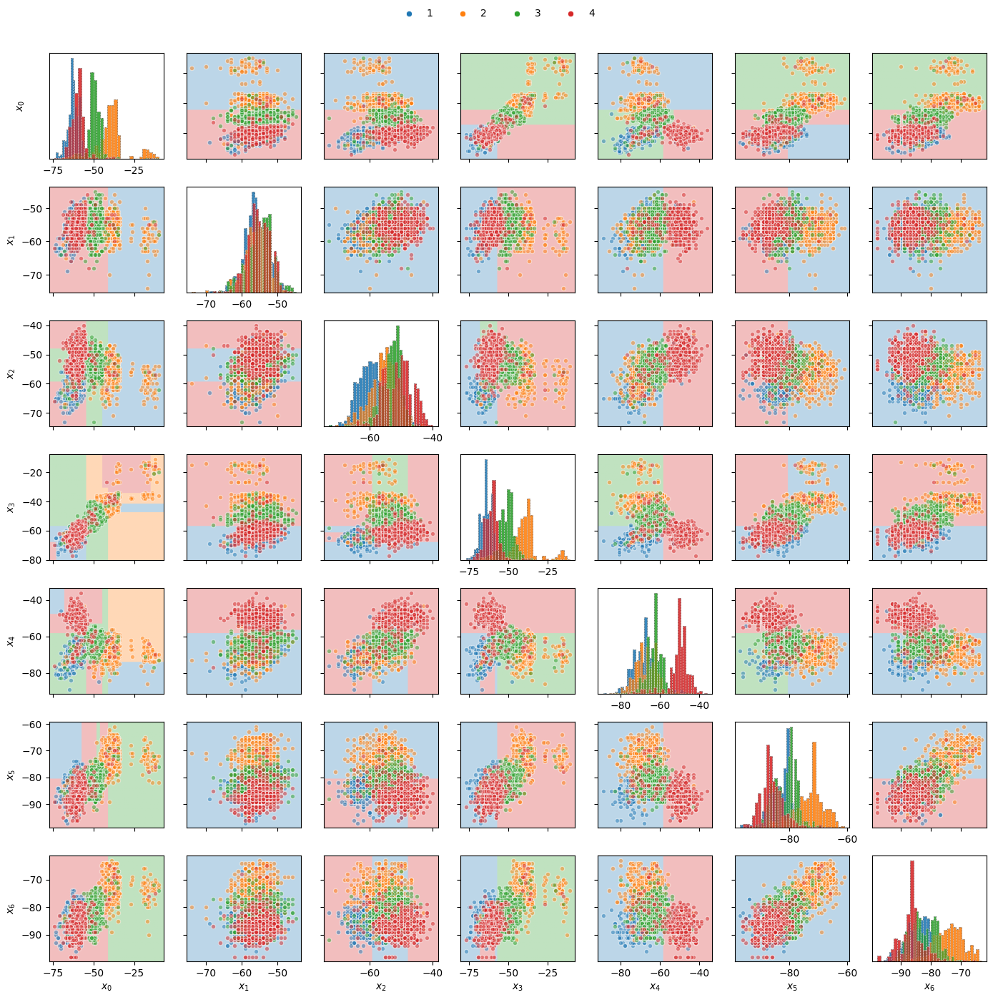

In [44]:
compair_pairgrid_tree_regions_same_grid(X_noisy, y_noisy, tree_noisy,
                                        X_noisy, y_noisy, tree_noisy_pre_prune,
                                        figsize_scale=2);

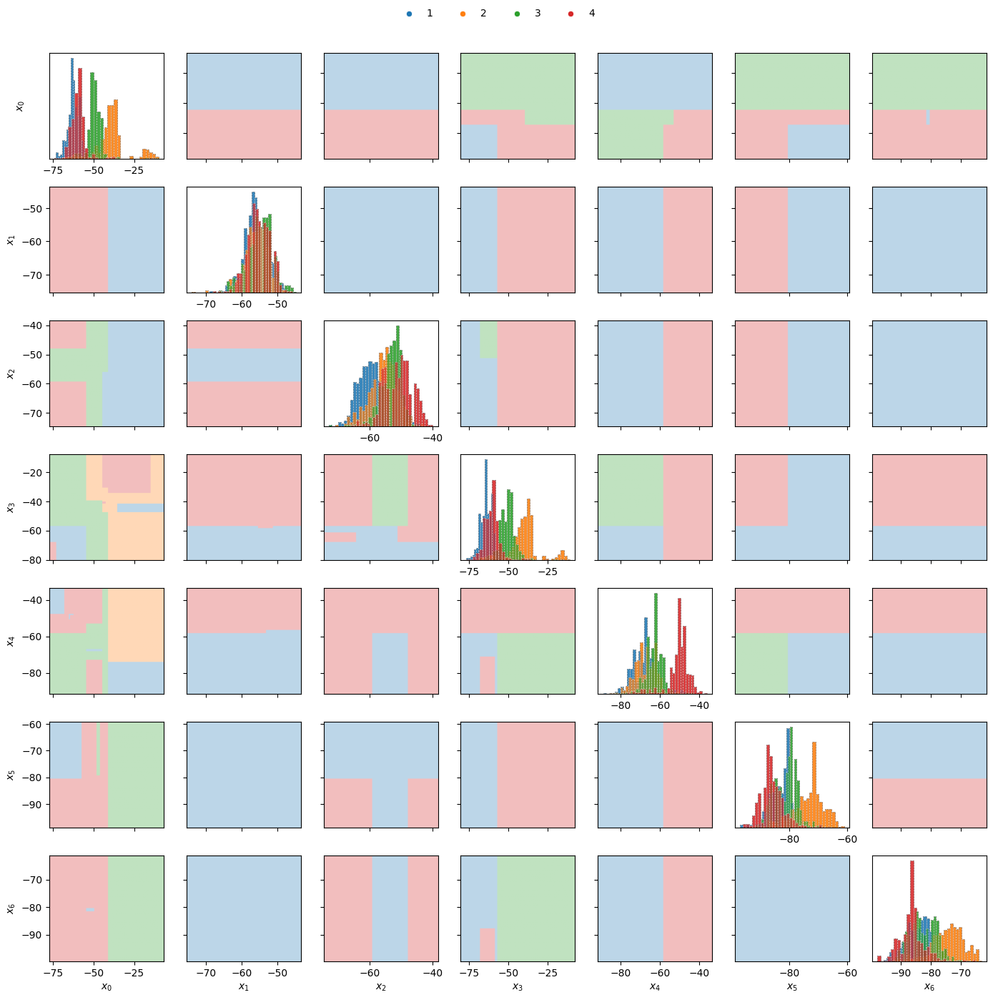

In [45]:
compair_pairgrid_tree_regions_same_grid(X_noisy, y_noisy, tree_noisy,
                                        X_noisy, y_noisy, tree_noisy_pre_prune,
                                        figsize_scale=2, show_points=False);